In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()
plt.style.use("grayscale")

In [3]:
df = pd.read_csv("./molecules/roboBohr.csv")

In [4]:
df.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,1267,1268,1269,1270,1271,1272,1273,1274,pubchem_id,Eat
0,0,73.516695,17.817765,12.469551,12.458130,12.454607,12.447345,12.433065,12.426926,12.387474,...,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,25004,-19.013763
1,1,73.516695,20.649126,18.527789,17.891535,17.887995,17.871731,17.852586,17.729842,15.864270,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25005,-10.161019
2,2,73.516695,17.830377,12.512263,12.404775,12.394493,12.391564,12.324461,12.238106,10.423249,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25006,-9.376619
3,3,73.516695,17.875810,17.871259,17.862402,17.850920,17.850440,12.558105,12.557645,12.517583,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25009,-13.776438
4,4,73.516695,17.883818,17.868256,17.864221,17.818540,12.508657,12.490519,12.450098,10.597068,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25011,-8.537140


In [5]:
df.shape

(16242, 1278)

In [6]:
df = df.drop(["Unnamed: 0", "pubchem_id"], axis=1)
df.shape

(16242, 1276)

In [7]:
df.Eat.describe()

count    16242.000000
mean       -11.178969
std          3.659133
min        -23.245373
25%        -13.475805
50%        -10.835211
75%         -8.623903
max         -0.789513
Name: Eat, dtype: float64

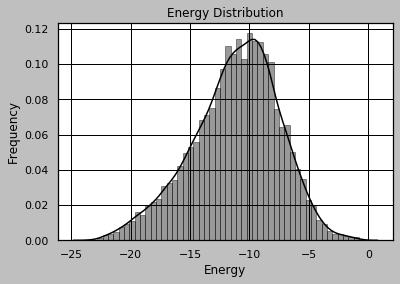

In [8]:
sns.distplot(df["Eat"])
plt.xlabel("Energy")
plt.ylabel("Frequency")
plt.title("Energy Distribution");

In [9]:
X = df.drop("Eat", axis=1).values
X.shape

(16242, 1275)

In [10]:
y = df["Eat"]
y.shape

(16242,)

In [11]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, shuffle=True, test_size=0.3)
X_train.shape, X_test.shape

((11369, 1275), (4873, 1275))

In [12]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler().fit(X_train)
Xt = StandardScaler().fit_transform(X)
X_train_std = scaler.transform(X_train)
X_test_std = scaler.transform(X_test)
X_train_std.shape, X_test_std.shape

((11369, 1275), (4873, 1275))

In [13]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

lin = LinearRegression().fit(X_train_std, y_train)
y_pred = lin.predict(X_test_std)
print("Test  R2: %s" % r2_score(y_test, y_pred))
y_pred = lin.predict(X_train_std)
print("Train R2: %s" % r2_score(y_train, y_pred))

Test  R2: -3685.751531763779
Train R2: 0.9710612520495232


This model is overfit. Let's try reducing the dimensions. The evolutionary algorithms are sure to be affected by the curse of dimensionality as well.

0.994474184503127

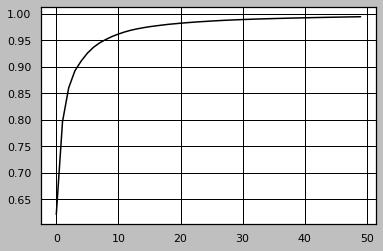

In [14]:
from sklearn.decomposition import PCA

n_components = 50
pca = PCA(n_components=n_components, whiten=True)
Z = pca.fit_transform(Xt)

rng = range(n_components)
plt.plot(rng, [np.cumsum(pca.explained_variance_ratio_)[n] for n in rng])
np.sum(pca.explained_variance_ratio_)

Looks like we can explain almost all of the variance with ~50 components. Let's see how these components relates to the energy levels.

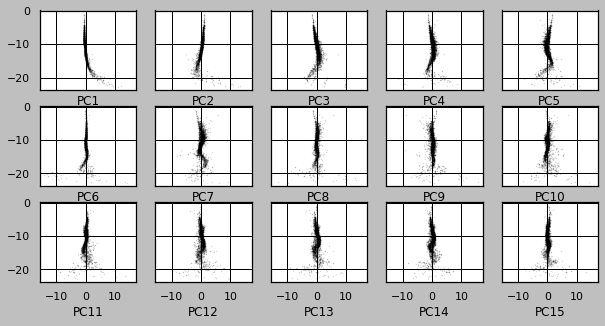

In [15]:
mask_random = np.random.randint(0, Z.shape[0], size=2500)

fig = plt.figure(figsize=(10, 5))
axes = fig.subplots(3, 5, sharex=True, sharey=True)
axes = np.array(axes).flatten()
for i in range(15):
    ax = axes[i]
    ax.set_xlabel("PC%s" % (i + 1))
    ax.scatter(Z[:, i][mask_random], y[mask_random], s=0.1, alpha=0.2)

We will also look at kernel PCA.

In [16]:
from sklearn.decomposition import KernelPCA

mask_random = np.random.randint(0, Xt.shape[0], size=2500)
kpca = KernelPCA(n_components=50, kernel="rbf", gamma=0.0005, random_state=0).fit(Xt[mask_random])
Z = kpca.transform(Xt)
Z.shape

(16242, 50)

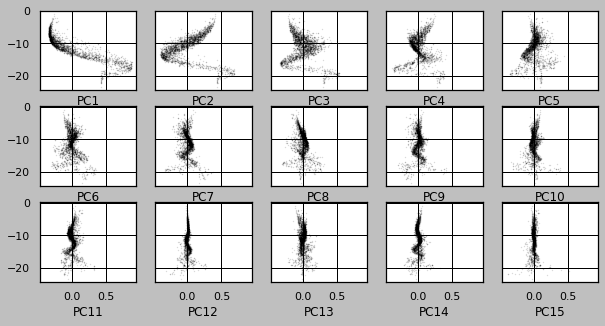

In [17]:
mask_random = np.random.randint(0, Z.shape[0], size=2500)

fig = plt.figure(figsize=(10, 5))
axes = fig.subplots(3, 5, sharex=True, sharey=True)
axes = np.array(axes).flatten()
for i in range(15):
    ax = axes[i]
    ax.set_xlabel("PC%s" % (i + 1))
    ax.scatter(Z[:, i][mask_random], y[mask_random], s=0.1, alpha=0.2)

In [33]:
pca = PCA(n_components=50, whiten=True).fit(X_train_std)
Z_train = pca.transform(X_train_std)
Z_test = pca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

In [34]:
lin = LinearRegression().fit(Z_train, y_train)
y_pred = lin.predict(Z_test)
print("Test  R2: %s" % r2_score(y_test, y_pred))
y_pred = lin.predict(Z_train)
print("Train R2: %s" % r2_score(y_train, y_pred))

Test  R2: 0.9476432993060651
Train R2: 0.948395147779088


In [35]:
mask_random = np.random.randint(0, X_train_std.shape[0], size=2500)
kpca = KernelPCA(n_components=50, kernel="rbf", gamma=0.0005, random_state=0).fit(X_train_std[mask_random])
Z_train = kpca.transform(X_train_std)
Z_test = kpca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

In [36]:
lin = LinearRegression().fit(Z_train, y_train)
y_pred = lin.predict(Z_test)
print("Test  R2: %s" % r2_score(y_test, y_pred))
y_pred = lin.predict(Z_train)
print("Train R2: %s" % r2_score(y_train, y_pred))

Test  R2: 0.9752489315906597
Train R2: 0.9745340561883


In [37]:
from algorithms import SimpleESRegressor
from algorithms import GeneticESRegressor
from algorithms import NaturalESRegressor
from algorithms import DifferentialEvolutionRegressor

def score(objective, iterations=100):
    ses = SimpleESRegressor(objective=objective, n_iter=iterations, random_state=0)
    ges = GeneticESRegressor(objective=objective, n_iter=iterations, random_state=0)
    nes = NaturalESRegressor(objective=objective, n_iter=iterations, random_state=0)
    dev = DifferentialEvolutionRegressor(objective=objective, n_iter=iterations * 10, random_state=0, bounds=(-20, 20))

    ses.fit(Z_train, y_train)
    ges.fit(Z_train, y_train)
    nes.fit(Z_train, y_train)
    dev.fit(Z_train, y_train)

    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    axes[0][0].set_title("Simple ES")
    axes[0][0].plot(range(iterations), ses.history_)
    axes[0][1].set_title("Genetic ES")
    axes[0][1].plot(range(iterations), ges.history_)
    axes[1][0].set_title("Natural ES")
    axes[1][0].plot(range(iterations), nes.history_)
    axes[1][1].set_title("Differential Evolution")
    axes[1][1].plot(range(iterations * 10), dev.history_)

    y_pred = ses.predict(Z_test)
    print("SimpleESRegressor              R2: %s" % r2_score(y_test, y_pred))
    y_pred = ges.predict(Z_test)
    print("GeneticESRegressor             R2: %s" % r2_score(y_test, y_pred))
    y_pred = nes.predict(Z_test)
    print("NaturalESRegressor             R2: %s" % r2_score(y_test, y_pred))
    y_pred = dev.predict(Z_test)
    print("DifferentialEvolutionRegressor R2: %s" % r2_score(y_test, y_pred))

In [38]:
Z_train = pca.transform(X_train_std)
Z_test = pca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

100%|██████████| 1000/1000 [00:11<00:00, 87.27it/s]
SimpleESRegressor              R2: 0.685775909009497
GeneticESRegressor             R2: 0.8725437577313557
NaturalESRegressor             R2: 0.9292873875341081
DifferentialEvolutionRegressor R2: 0.5998702338537109


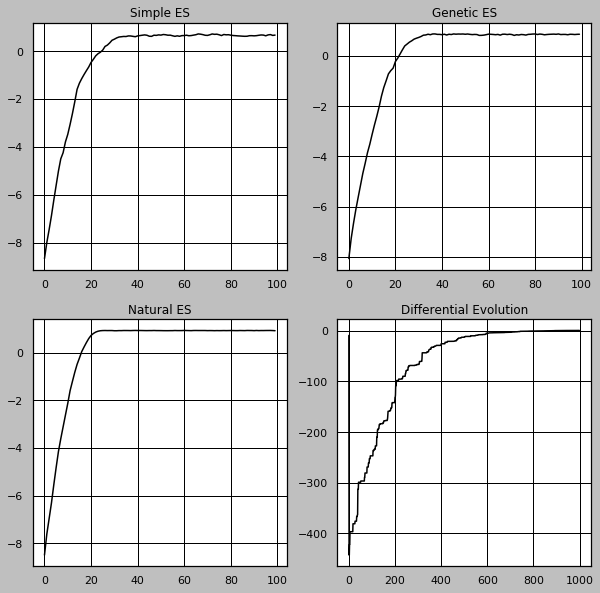

In [39]:
from objectives import RSSObjective

score(RSSObjective())

It looks like each algorithm has converged on some local optimum, with some doing better than others. We could play around with parameters, but for now we'll switch to kernel PCA transformed data.

In [40]:
Z_train = kpca.transform(X_train_std)
Z_test = kpca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

100%|██████████| 2500/2500 [00:29<00:00, 85.60it/s]
SimpleESRegressor              R2: 0.9732519328067293
GeneticESRegressor             R2: 0.9742133234684399
NaturalESRegressor             R2: 0.9606770730285923
DifferentialEvolutionRegressor R2: 0.9752538866918705


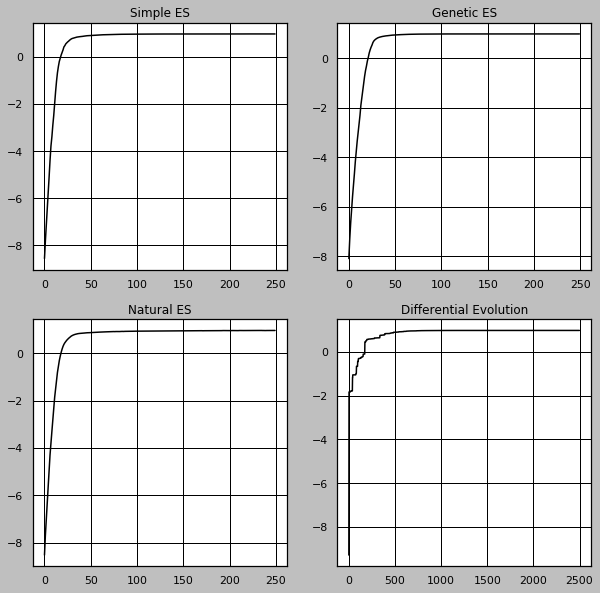

In [41]:
score(RSSObjective(), iterations=250)

In [69]:
mask_random = np.random.randint(0, Xt.shape[0], size=3000)
kpca = KernelPCA(n_components=50, kernel="rbf", gamma=0.0005, random_state=0).fit(Xt[mask_random])
Z = kpca.transform(Xt)
Z.shape

(16242, 50)

In [77]:
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score

ges = GeneticESRegressor(objective=RSSObjective(), n_iter=250, random_state=0, p_elite=20)
ges = make_pipeline(StandardScaler(), ges)
ges_score = cross_val_score(ges, Z, y)

lin = make_pipeline(StandardScaler(), LinearRegression())
lin_score = cross_val_score(lin, Z, y)

  0%|          | 0/250 [00:00<?, ?it/s]


In [75]:
print("GeneticESRegressor R2: %0.5f (+/- %0.5f)" % (ges_score.mean(), ges_score.std() * 2))
print("LinearRegression   R2: %0.5f (+/- %0.5f)" % (lin_score.mean(), lin_score.std() * 2))

DifferentialEvolutionRegressor R2: -0.29472 (+/- 0.99769)
LinearRegression               R2: 0.97232 (+/- 0.01672)


In [76]:
dev_score

array([-0.79543915,  0.38486601,  0.11871321, -0.2864692 , -0.89528244])